# NMF for Polyphonic Music Transcription

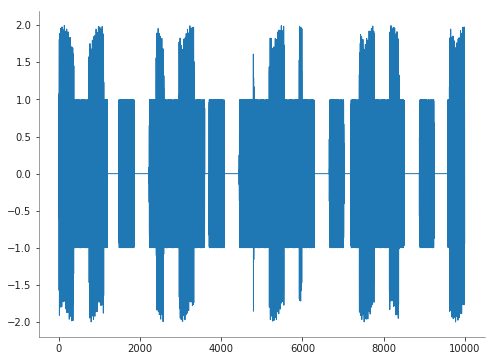

In [1]:
# library imports
import os
import IPython
import numpy as np
import matplotlib.pyplot as plt
import sklearn.decomposition as skl
from matplotlib.pyplot import figure
from scipy import signal
from scipy.io import wavfile
from matplotlib.pylab import *
%matplotlib inline

rcParams['figure.figsize'] = (8,6)
rcParams['lines.linewidth'] = 1
rcParams['image.cmap'] = 'Greys'
rcParams['axes.spines.right'] = False
rcParams['axes.spines.top'] = False
rcParams['font.weight'] = 400
rcParams['xtick.color'] = '#222222'
rcParams['ytick.color'] = '#222222'
rcParams['grid.color'] = '#dddddd'
rcParams['grid.linestyle'] = '-'
rcParams['grid.linewidth'] = 0.5
rcParams['axes.titlesize'] = 11
rcParams['axes.titleweight'] = 500
rcParams['axes.labelsize'] = 10
rcParams['axes.labelweight'] = 400
rcParams['axes.linewidth'] = 0.5
rcParams['axes.edgecolor'] = [.25,.25,.25]

# gate function
def g(t, T=2*np.pi):
    return (np.abs(t) % T < T/2).astype(int)

def rand(scale=1):
    return scale * np.random.random()

t = np.linspace(0,100,10000)
α, β, γ, δ = rand(), rand(), 10000*rand(), 10000*rand()
x = g(α*t) * np.sin(γ*t) + g(β*t) * np.sin(δ*t)
IPython.display.display(IPython.display.Audio(x, rate=8000))
plt.plot(x)

### STFT

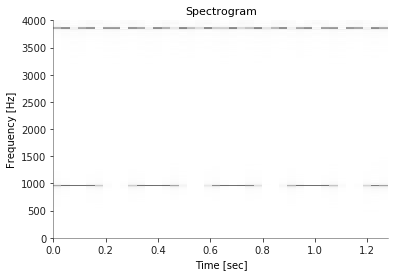

In [2]:
class STFT:
    def __init__(self, x, window_size=1024, sampling_rate=8000):
        self.q, self.t, self.f = signal.stft(x, sampling_rate, nperseg=window_size, window='hanning', noverlap=3/4 * window_size)
        self.f = np.abs(self.f)
    
    def spectrogram(self, scale=None):
        f = self.f
        if scale and scale=='log':
            f = np.log(f)
        if scale and scale=='sqrt':
            f = np.sqrt(f)
        plt.pcolormesh(self.t, self.q, f, cmap='Greys')
        plt.ylabel('Frequency [Hz]')
        plt.xlabel('Time [sec]')
        plt.title('Spectrogram')
        plt.show()

stft = STFT(x, 1024)
stft.spectrogram()

## NMF

In [3]:
model = skl.NMF(n_components=2, solver='mu', beta_loss='kullback-leibler')
W = model.fit_transform(stft.f).T
H = model.components_

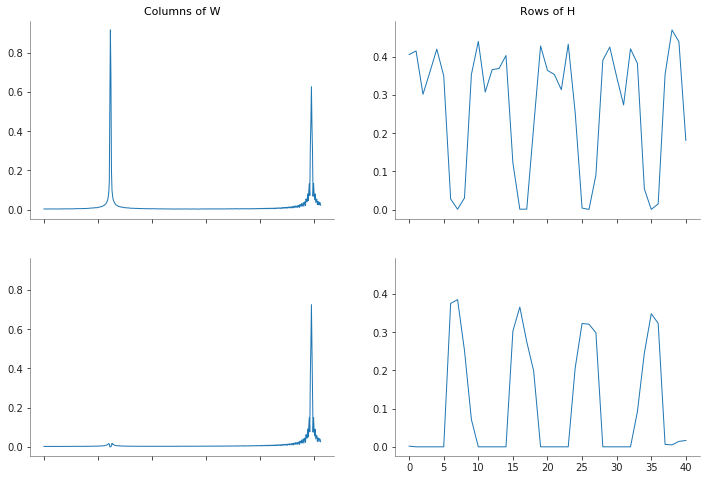

In [4]:
def plot_decomposition(W, H, k, height=8, width=12):
    f, ax = plt.subplots(k, 2, sharex='col', sharey='col')
    f.set_figheight(height); f.set_figwidth(width)
    ax[0,0].set_title("Columns of W")
    ax[0,1].set_title("Rows of H")
    
    plt.setp([a.get_xticklabels() for a in f.axes[:-1]], visible=False)
    
    for i in range(k):
        ax[i,0].plot(range(W.shape[1]), W[i])
        ax[i,1].plot(range(H.shape[1]), H[i])
        
plot_decomposition(W, H, 2)

# Bach’s fugue XVI in G minor
by Keith Jarrett

(sampled at 44,100kHz and converted to mono by averaging the left and right channels)

In [5]:
sample_rate, wav = wavfile.read(os.path.join('data', 'bach.wav'))
IPython.display.display(IPython.display.Audio(wav, rate=sample_rate))

## Isolated Notes

/Users/zubin/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log
  if __name__ == '__main__':


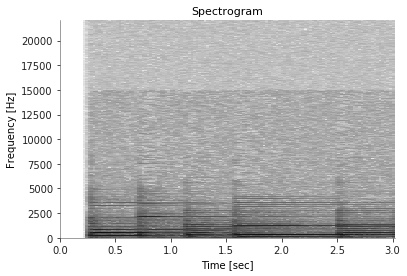

In [6]:
def clip(wav, begin, end, sample_rate=44100):
    return wav[int(sample_rate * begin):int(sample_rate * end)]

sound_clip = clip(wav, 0, 3)
stft = STFT(sound_clip, 4096, 44100)
stft.spectrogram(scale='log')

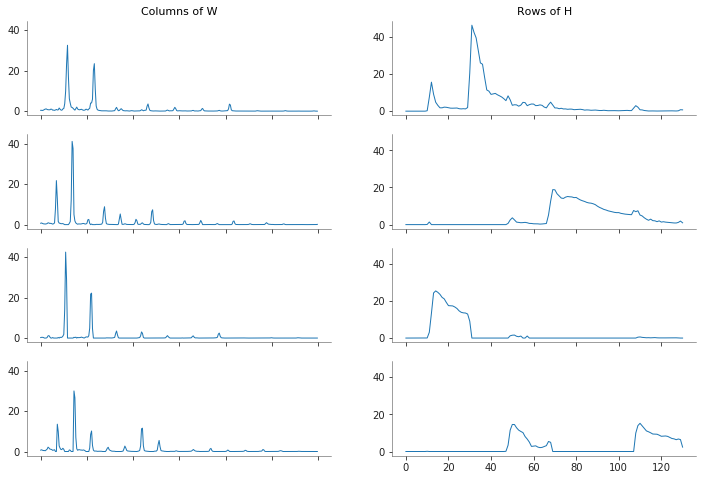

In [7]:
model = skl.NMF(n_components=4, solver='mu', beta_loss='kullback-leibler')
W = model.fit_transform(stft.f).T
H = model.components_
plot_decomposition(W[:,:300], H, 4)

## More Components than Notes

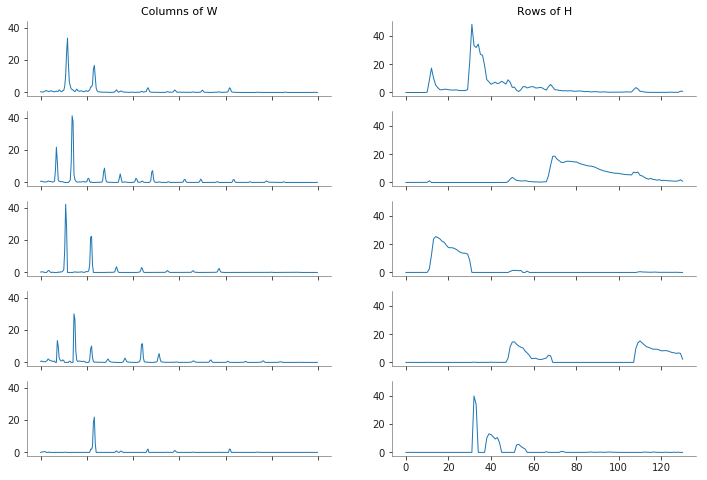

In [8]:
model = skl.NMF(n_components=5, solver='mu', beta_loss='kullback-leibler')
W = model.fit_transform(stft.f).T
H = model.components_
plot_decomposition(W[:,:300], H, 5)

## Coinciding Notes

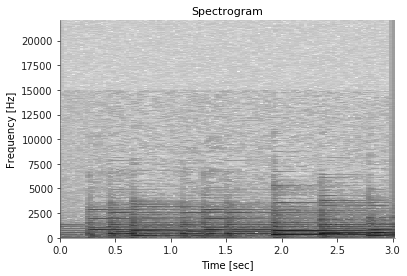

In [9]:
sound_clip = clip(wav, 3.5, 6.5)
IPython.display.display(IPython.display.Audio(sound_clip, rate=sample_rate))
stft = STFT(sound_clip, 4096, 44100)
stft.spectrogram(scale='log')

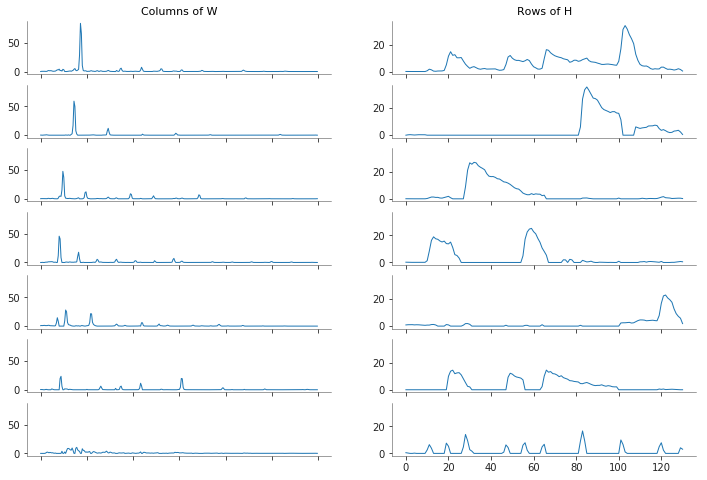

In [10]:
k=7
model = skl.NMF(n_components=k, solver='mu', beta_loss='kullback-leibler')
W = model.fit_transform(stft.f).T
H = model.components_
plot_decomposition(W[:,:300], H, k)

### First 2 bars

/Users/zubin/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log
  if __name__ == '__main__':


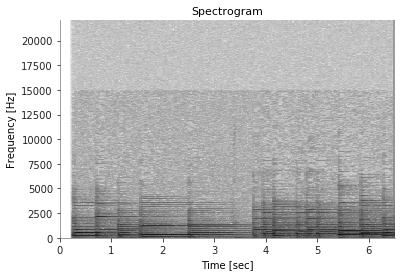

In [11]:
sound_clip = clip(wav, 0, 6.5)
IPython.display.display(IPython.display.Audio(sound_clip, rate=sample_rate))
stft = STFT(sound_clip, 4096, 44100)
stft.spectrogram(scale='log')

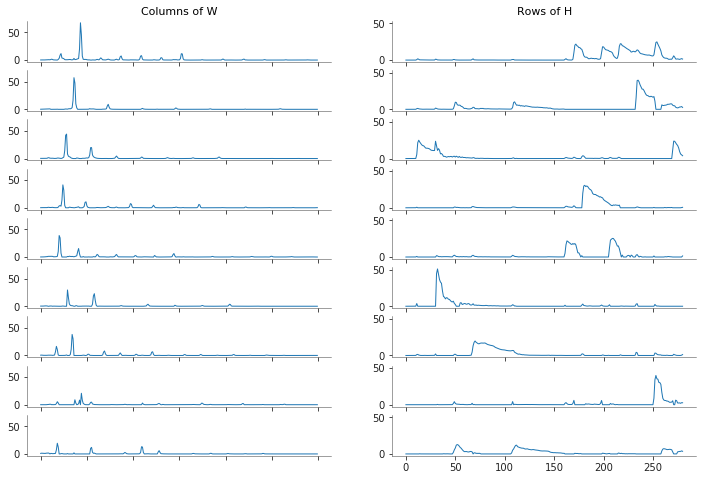

In [12]:
k=9
model = skl.NMF(n_components=k, solver='mu', beta_loss='kullback-leibler')
W = model.fit_transform(stft.f).T
H = model.components_
plot_decomposition(W[:,:300], H, k)

## First 6 bars

/Users/zubin/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log
  if __name__ == '__main__':


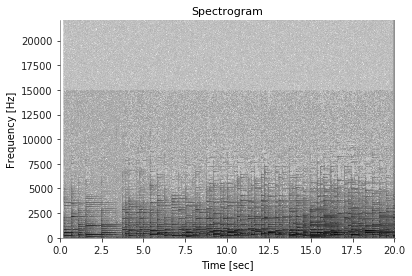

In [13]:
sound_clip = clip(wav, 0, 20)
IPython.display.display(IPython.display.Audio(sound_clip, rate=sample_rate))
stft = STFT(sound_clip, 4096, 44100)
stft.spectrogram(scale='log')

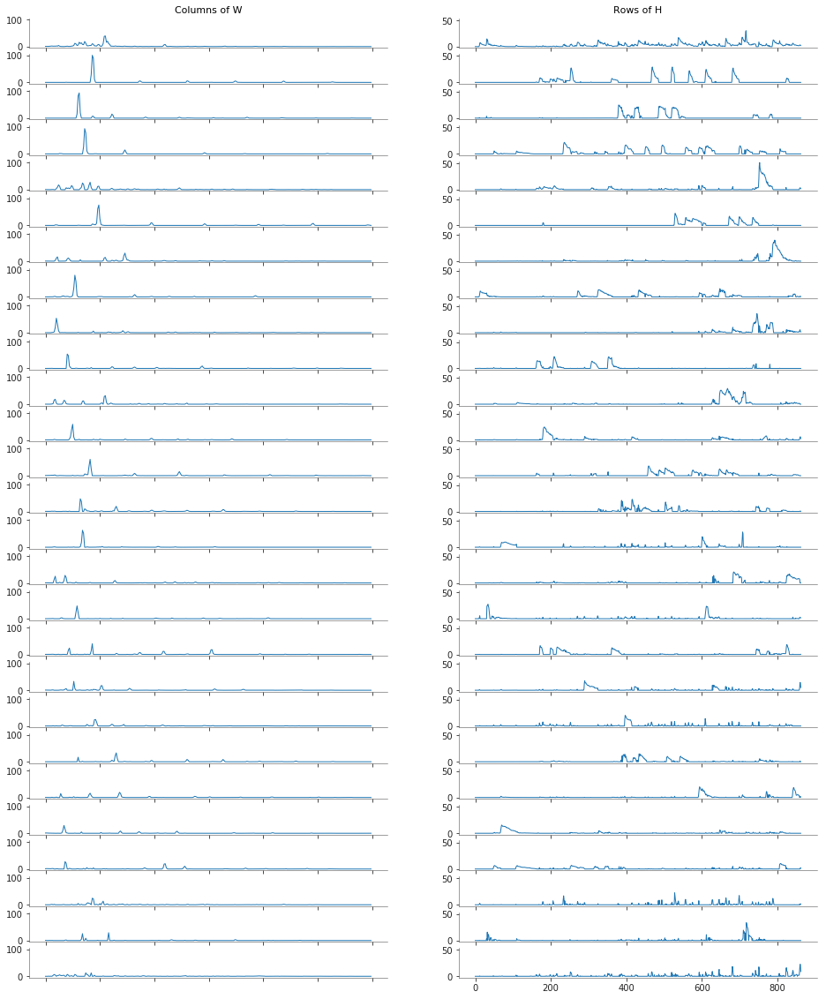

In [14]:
k=27
model = skl.NMF(n_components=k, solver='mu', beta_loss='kullback-leibler', max_iter=500)
W = model.fit_transform(stft.f).T
H = model.components_
plot_decomposition(W[:, :300], H, k, height=20, width=16)